# Calculate the gravity disturbance, the topographic mass effect, and the topo-corrected gravity disturbance. 

Here, we'll load the raw gravity and topography data downloaded as part of the [Antarctic-Plots](https://antarctic-plots.readthedocs.io/) package and calculate the the disturbance and the topo-corrected disturgance

In [1]:
%%capture
%load_ext autoreload
%autoreload 2
import boule
import verde
import xarray as xr
import pygmt
import verde as vd
import pandas as pd
import numpy as np
from antarctic_plots import maps, utils, regions, fetch, profile
from RIS_gravity_inversion import utils as inv_utils
from RIS_gravity_inversion import plotting
import string
from matplotlib import pyplot as plt
import seaborn as sns

sns.set_theme()

In [2]:
region = regions.antarctica

## Collect data 
The data we need (in the form of netcdf or tiff files) can be downloaded and accessed with the package _Antarctic-Plots_ through the fetch module. 

These dataset will be returned as xarray DataArrays, which are 2D grids of a single variable.

In [3]:
eigen_gravity = fetch.gravity(version="eigen", spacing=10e3, region=region)
eigen_geoid = fetch.geoid(spacing=10e3, region=region)
antgg_update_disturbance = fetch.gravity(
    version="antgg-update",
    anomaly_type="DG",
    spacing=10e3,
    region=region,
)
antgg_update_anomaly = fetch.gravity(
    version="antgg-update",
    anomaly_type="FA",
    spacing=10e3,
    region=region,
)

/home/tankerma/miniconda/envs/RIS_gravity_inversion/lib/python3.10/site-packages/xarray/backends/plugins.py:71: RuntimeWarning: Engine 'cfgrib' loading failed:
Cannot find the ecCodes library
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)


spacing larger than original, filtering and resampling


grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


spacing larger than original, filtering and resampling


grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


returning grid with new region and/or registration, same spacing
returning grid with new region and/or registration, same spacing


print out some info about the grids in the following format:

* spacing
* extent
* min value
* max value
* grid registration type

In [4]:
print("Eigen gravity info:", utils.get_grid_info(eigen_gravity))
print("Eigen geoid info:", utils.get_grid_info(eigen_geoid))

Eigen gravity info: (10000.0, [-2800000.0, 2800000.0, -2800000.0, 2800000.0], 978391.4375, 980167.625, 'g')
Eigen geoid info: (10000.0, [-2800000.0, 2800000.0, -2800000.0, 2800000.0], -66.1228713989, 45.4845733643, 'g')


merge the grids into 1 dataset and convert it from a 2D grid into a table

In [5]:
data = xr.merge(
    [
        eigen_gravity.rename("gravity"),
        eigen_geoid.rename("geoid"),
    ]
)
data

<xarray.Dataset>
Dimensions:  (x: 561, y: 561)
Coordinates:
  * x        (x) float64 -2.8e+06 -2.79e+06 -2.78e+06 ... 2.79e+06 2.8e+06
  * y        (y) float64 -2.8e+06 -2.79e+06 -2.78e+06 ... 2.79e+06 2.8e+06
Data variables:
    gravity  (y, x) float32 9.784e+05 9.784e+05 ... 9.784e+05 9.784e+05
    geoid    (y, x) float32 -17.31 -17.49 -17.64 -17.72 ... 45.19 45.32 45.48
Attributes:
    long_name:     z
    actual_range:  [978391.4375 980167.625 ]

In [6]:
# convert to a pandas dataframe
df = verde.grid_to_table(data)

# reproject epsg3031 back to lat lon
df = utils.epsg3031_to_latlon(df)

# rename observed gravity column
df.rename(
    columns={
        "gravity": "eigen_gravity",
        # "x":"easting",
        # "y":"northing",
    },
    inplace=True,
)

# add observation height column relative to ellipsoid and geoid
df["obs_height_ellipsoid"] = 10e3
df["obs_height_geoid"] = df.obs_height_ellipsoid + df.geoid

df.describe()

,y,x,eigen_gravity,geoid,lat,lon,obs_height_ellipsoid,obs_height_geoid
count,3.147210e+05,3.147210e+05,314721.000000,314721.000000,314721.000000,314721.000000,314721.0,314721.000000
mean,0.000000e+00,0.000000e+00,979488.750000,-14.109856,-70.501232,0.160142,10000.0,9985.890145
std,1.619468e+06,1.619468e+06,380.408081,28.106897,7.152484,103.404070,0.0,28.106898
min,-2.800000e+06,-2.800000e+06,978391.437500,-66.122871,-90.000000,-179.795373,10000.0,9933.877129
25%,-1.400000e+06,-1.400000e+06,979216.937500,-37.590160,-75.509262,-89.795373,10000.0,9962.409840
50%,0.000000e+00,0.000000e+00,979497.375000,-16.644913,-69.610713,0.000000,10000.0,9983.355087
75%,1.400000e+06,1.400000e+06,979808.500000,11.482105,-65.152388,90.000000,10000.0,10011.482105
max,2.800000e+06,2.800000e+06,980167.625000,45.484573,-54.673529,180.000000,10000.0,10045.484573


plot all the datasets

## Calculate Normal gravity
at 10km altitude, relative to the ellipsoid

In [7]:
# calculated normal gravity at all Eigen observation locations for a given latitude and height
df["normal_gravity"] = boule.WGS84.normal_gravity(
    latitude=df.lat,
    height=df.obs_height_ellipsoid,
)

# convert back to a grid from a dataframe
normal_gravity = df.set_index(["y", "x"]).to_xarray().normal_gravity

## Calculate gravity disturbance

Gravity disturbances are the differences between the measured gravity and a reference (normal) gravity produced by an ellipsoid.

In [8]:
gravity_disturbance = eigen_gravity - normal_gravity

df["disturbance"] = df.eigen_gravity - df.normal_gravity

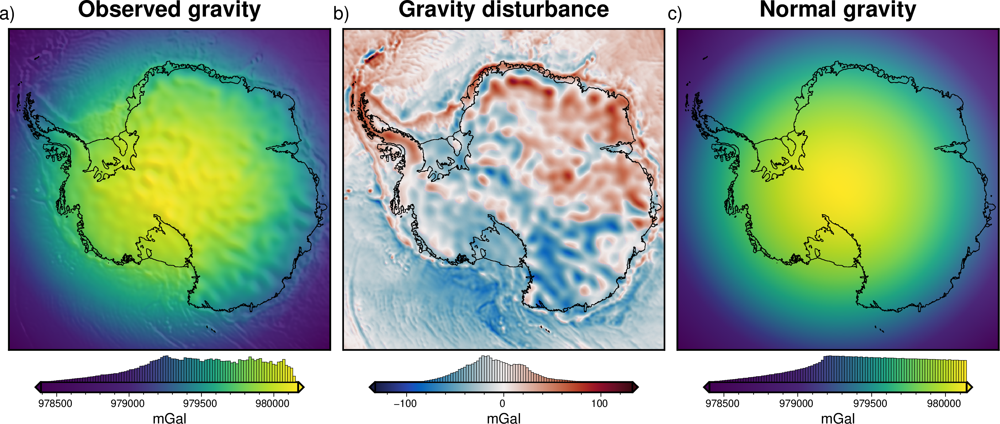

In [9]:
# plot observed gravity
fig = maps.plot_grd(
    eigen_gravity,
    fig_height=10,
    coast=True,
    coast_pen="0.4p,black",
    region=region,
    grd2cpt=True,
    cmap="viridis",
    cbar_label="mGal",
    title="Observed gravity",
    shading="+a45+nt0.2",
    hist=True,
    cbar_yoffset=1,
    # hist_bin_num=50,
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

# get max absolute value of the disturbance
maxabs = verde.maxabs(gravity_disturbance)
# plot gravity disturbance
fig = maps.plot_grd(
    gravity_disturbance,
    coast=True,
    coast_pen="0.4p,black",
    region=region,
    cmap="balance+h0",
    cpt_lims=[-maxabs, maxabs],
    cbar_label="mGal",
    title="Gravity disturbance",
    shading="+a45+nt0.2",
    hist=True,
    cbar_yoffset=1,
    # hist_bin_num=50,
    fig=fig,
    origin_shift="xshift",
)
fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

# plot normal gravity
fig = maps.plot_grd(
    normal_gravity,
    coast=True,
    coast_pen="0.4p,black",
    region=region,
    grd2cpt=True,
    cmap="viridis",
    cbar_label="mGal",
    title="Normal gravity",
    shading="+a45+nt0.2",
    hist=True,
    cbar_yoffset=1,
    # hist_bin_num=50,
    fig=fig,
    origin_shift="xshift",
)
fig.text(
    position="TL",
    justify="BL",
    text="c)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

fig.show()

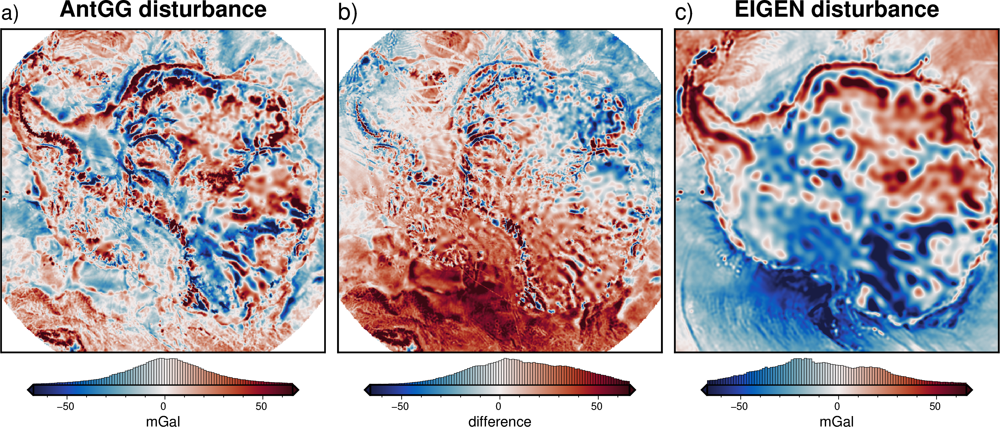

In [53]:
grav_grids = df.set_index(["y", "x"]).to_xarray()

# compare with Terrain-free gravity disturbance
anttgg_diff_grids = utils.grd_compare(
    antgg_update_disturbance,
    grav_grids.disturbance,
    fig_height=10,
    plot=True,
    grid1_name="AntGG disturbance",
    grid2_name="EIGEN disturbance",
    cbar_label="mGal",
    title="",
    rmse_in_title=False,
    inset=False,
    coast=False,
    cmap="balance+h",
    diff_cmap="balance",
    hist=True,
    cbar_yoffset=1,
    subplot_labels=True,
    robust=True,
    # shading="+a45+nt0.2",
)

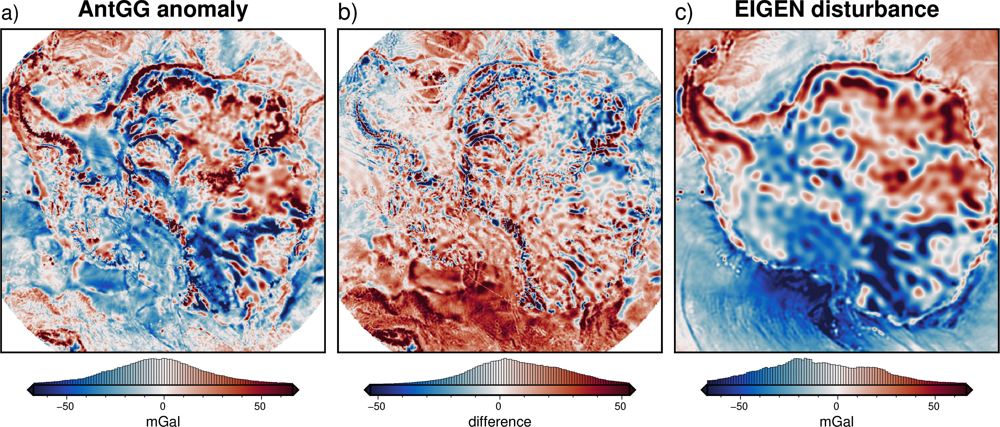

In [51]:
grav_grids = df.set_index(["y", "x"]).to_xarray()

# compare with Terrain-free gravity disturbance
anttgg_diff_grids = utils.grd_compare(
    antgg_update_anomaly,
    grav_grids.disturbance,
    fig_height=10,
    plot=True,
    grid1_name="AntGG anomaly",
    grid2_name="EIGEN disturbance",
    cbar_label="mGal",
    title="",
    rmse_in_title=False,
    inset=False,
    coast=False,
    cmap="balance+h",
    diff_cmap="balance",
    hist=True,
    cbar_yoffset=1,
    subplot_labels=True,
    robust=True,
    # shading="+a45+nt0.2",
)

# Terrain-free gravity disturbance

## download topography 

In [9]:
surface = fetch.bedmap2(
    layer="surface",
    spacing=20e3,
    region=regions.antarctica,
    fill_nans=True,
    reference="ellipsoid",  # converts to be referenced to the ellipsoid
)
icebase = fetch.bedmap2(
    layer="icebase",
    spacing=20e3,
    region=regions.antarctica,
    fill_nans=True,  # fills nans over ocean with 0's (while still reference to the geoid)
    reference="ellipsoid",  # converts to be referenced to the ellipsoid
)
bed = fetch.bedmap2(
    layer="bed",
    spacing=20e3,
    region=regions.antarctica,
    fill_nans=True,  # fills nans over ocean with 0's (while still reference to the geoid)
    reference="ellipsoid",  # converts to be referenced to the ellipsoid
)

converting to be referenced to the WGS84 ellipsoid
spacing larger than original, filtering and resampling


grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


converting to be referenced to the WGS84 ellipsoid
spacing larger than original, filtering and resampling


grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


converting to be referenced to the WGS84 ellipsoid
spacing larger than original, filtering and resampling


grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.


## Ensure layers don't cross
These topographic layers are continuous across Antarctica, meaning, where bed rock is above the ice surface, the surface, icebase, and bedrock are all equal. Similarly, on the ocean surface the icebase is equal to the surface. Therefore, these layers should never cross. The below cell fixes locations where minor errors have the layters crossing.

In [10]:
# anywhere bed is above icebase, set equal to icebase
bed = xr.where(bed > icebase, icebase, bed)

# anywhere bed is above surface, set equal to surface
bed = xr.where(bed > surface, surface, bed)

# anywhere icebase is above surface, set equal to surface
icebase = xr.where(icebase > surface, surface, icebase)

# check it worked
assert np.all(surface - icebase) >= 0
assert np.all(surface - bed) >= 0
assert np.all(icebase - bed) >= 0

## set densities

In [11]:
# set densities
air_density = 1
ice_density = 917
water_density = 1024
earth_density = 2670

## make prism layers

In [12]:
ice_surface_prisms = inv_utils.grids_to_prisms(
    surface=surface,
    reference=0,
    density=xr.where(
        surface >= 0, ice_density - air_density, air_density - ice_density
    ),
    input_coord_names=["x", "y"],
)

water_surface_prisms = inv_utils.grids_to_prisms(
    surface=icebase,
    reference=0,
    density=xr.where(
        icebase >= 0, water_density - ice_density, ice_density - water_density
    ),
    input_coord_names=["x", "y"],
)

bed_prisms = inv_utils.grids_to_prisms(
    surface=bed,
    reference=0,
    density=xr.where(
        bed >= 0,
        earth_density - water_density,
        water_density - earth_density,
    ),
    input_coord_names=["x", "y"],
)

Number of ice surface prisms: 74689
Number of water surface prisms: 74689
Number of bed prisms: 74689


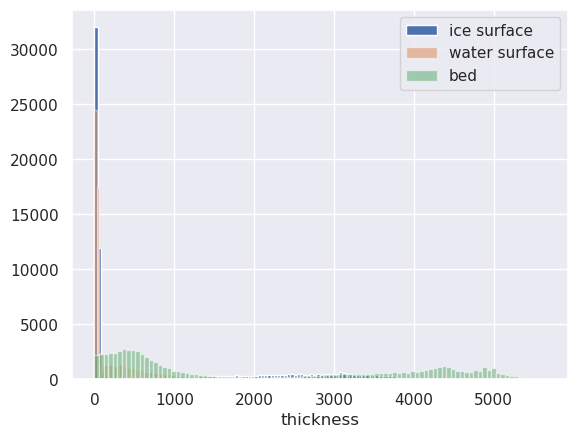

In [13]:
_ = ice_surface_prisms.thickness.plot.hist(bins=100, label="ice surface")
_ = water_surface_prisms.thickness.plot.hist(bins=100, alpha=0.5, label="water surface")
_ = bed_prisms.thickness.plot.hist(bins=100, alpha=0.5, label="bed")


print(
    f"Number of ice surface prisms:",
    len(
        ice_surface_prisms.thickness.values[
            ~np.isnan(ice_surface_prisms.thickness.values)
        ]
    ),
)
print(
    f"Number of water surface prisms:",
    len(
        water_surface_prisms.thickness.values[
            ~np.isnan(water_surface_prisms.thickness.values)
        ]
    ),
)
print(
    f"Number of bed prisms:",
    len(bed_prisms.thickness.values[~np.isnan(bed_prisms.thickness.values)]),
)

plt.legend()

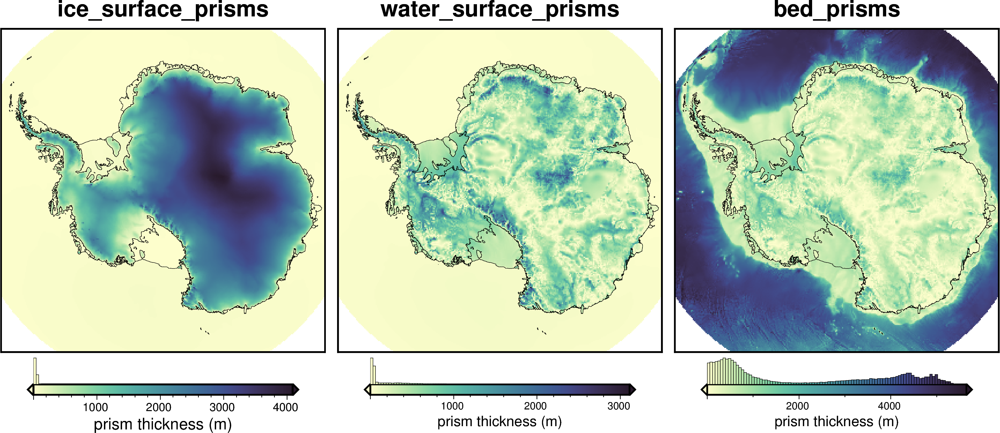

In [14]:
fig = maps.plot_grd(
    ice_surface_prisms.thickness,
    fig_height=10,
    coast=True,
    coast_pen="0.2p,black",
    title="ice_surface_prisms",
    cbar_label="prism thickness (m)",
    cmap="deep",
    hist=True,
    cbar_yoffset=1,
)

fig = maps.plot_grd(
    water_surface_prisms.thickness,
    fig_height=10,
    coast=True,
    coast_pen="0.2p,black",
    title="water_surface_prisms",
    cbar_label="prism thickness (m)",
    cmap="deep",
    hist=True,
    cbar_yoffset=1,
    fig=fig,
    origin_shift="xshift",
)

fig = maps.plot_grd(
    bed_prisms.thickness,
    coast=True,
    coast_pen="0.2p,black",
    title="bed_prisms",
    cbar_label="prism thickness (m)",
    cmap="deep",
    hist=True,
    cbar_yoffset=1,
    fig=fig,
    origin_shift="xshift",
)

fig.show()

## Calculate gravity

In [15]:
df.head()

,y,x,eigen_gravity,geoid,lat,lon,obs_height_ellipsoid,obs_height_geoid,normal_gravity,disturbance
0,-2800000.0,-2800000.0,978411.3125,-17.313961,-54.673529,-135.000000,10000.0,9982.686039,978401.798229,9.514271
1,-2800000.0,-2790000.0,978413.8125,-17.490627,-54.732780,-135.102497,10000.0,9982.509373,978406.868187,6.944313
2,-2800000.0,-2780000.0,978416.9375,-17.642357,-54.791943,-135.205360,10000.0,9982.357643,978411.926991,5.010509
3,-2800000.0,-2770000.0,978421.1875,-17.720049,-54.851019,-135.308592,10000.0,9982.279951,978416.974575,4.212925
4,-2800000.0,-2760000.0,978426.6875,-17.750841,-54.910005,-135.412193,10000.0,9982.249159,978422.010876,4.676624


In [16]:
# calculate gravity of prisms
forward_grid, forward_df = inv_utils.forward_grav_of_prismlayer(
    [
        ice_surface_prisms,
        water_surface_prisms,
        bed_prisms,
    ],
    df,
    names=[
        "ice_surface_prisms",
        "water_surface_prisms",
        "bed_prisms",
    ],
    coord_names=["x", "y", "obs_height_ellipsoid"],
    # thickness_threshold=1,
    progressbar=True,
    plot=False,
)

df["ice_surface_grav"] = forward_df.ice_surface_prisms
df["water_surface_grav"] = forward_df.water_surface_prisms
df["bed_grav"] = forward_df.bed_prisms

df.describe()

  0%|                                                | 0/314721 [00:00<?, ?it/s]

  0%|                                                | 0/314721 [00:00<?, ?it/s]

  0%|                                                | 0/314721 [00:00<?, ?it/s]

,y,x,eigen_gravity,geoid,lat,lon,obs_height_ellipsoid,obs_height_geoid,normal_gravity,disturbance,ice_surface_grav,water_surface_grav,bed_grav
count,3.147210e+05,3.147210e+05,314721.000000,314721.000000,314721.000000,314721.000000,314721.0,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000
mean,0.000000e+00,0.000000e+00,979488.750000,-14.109856,-70.501232,0.160142,10000.0,9985.890145,979498.184552,-9.387069,32.017926,0.010743,-114.403521
std,1.619468e+06,1.619468e+06,380.408081,28.106897,7.152484,103.404070,0.0,28.106898,384.692027,29.876707,46.922162,1.709400,132.750994
min,-2.800000e+06,-2.800000e+06,978391.437500,-66.122871,-90.000000,-179.795373,10000.0,9933.877129,978401.798229,-97.639721,-2.302918,-8.595827,-352.298985
25%,-1.400000e+06,-1.400000e+06,979216.937500,-37.590160,-75.509262,-89.795373,10000.0,9962.409840,979222.512686,-29.984284,-0.283593,-0.261934,-255.190096
50%,0.000000e+00,0.000000e+00,979497.375000,-16.644913,-69.610713,0.000000,10000.0,9983.355087,979509.874405,-11.344771,1.252138,-0.050296,-49.668322
75%,1.400000e+06,1.400000e+06,979808.500000,11.482105,-65.152388,90.000000,10000.0,10011.482105,979816.006810,11.593298,67.724905,0.120799,-5.045478
max,2.800000e+06,2.800000e+06,980167.625000,45.484573,-54.673529,180.000000,10000.0,10045.484573,980142.335092,132.368033,154.819709,9.538499,144.760767


## Correct the observed gravity

In [17]:
df["terrain_effect"] = df.ice_surface_grav + df.water_surface_grav + df.bed_grav

df["terrain_free_disturbance"] = df.disturbance - df.terrain_effect

df.describe()

,y,x,eigen_gravity,geoid,lat,lon,obs_height_ellipsoid,obs_height_geoid,normal_gravity,disturbance,ice_surface_grav,water_surface_grav,bed_grav,terrain_effect,terrain_free_disturbance
count,3.147210e+05,3.147210e+05,314721.000000,314721.000000,314721.000000,314721.000000,314721.0,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000
mean,0.000000e+00,0.000000e+00,979488.750000,-14.109856,-70.501232,0.160142,10000.0,9985.890145,979498.184552,-9.387069,32.017926,0.010743,-114.403521,-82.374851,72.987782
std,1.619468e+06,1.619468e+06,380.408081,28.106897,7.152484,103.404070,0.0,28.106898,384.692027,29.876707,46.922162,1.709400,132.750994,167.812832,162.467066
min,-2.800000e+06,-2.800000e+06,978391.437500,-66.122871,-90.000000,-179.795373,10000.0,9933.877129,978401.798229,-97.639721,-2.302918,-8.595827,-352.298985,-350.819198,-242.804245
25%,-1.400000e+06,-1.400000e+06,979216.937500,-37.590160,-75.509262,-89.795373,10000.0,9962.409840,979222.512686,-29.984284,-0.283593,-0.261934,-255.190096,-255.985855,-67.214629
50%,0.000000e+00,0.000000e+00,979497.375000,-16.644913,-69.610713,0.000000,10000.0,9983.355087,979509.874405,-11.344771,1.252138,-0.050296,-49.668322,-42.057152,32.749549
75%,1.400000e+06,1.400000e+06,979808.500000,11.482105,-65.152388,90.000000,10000.0,10011.482105,979816.006810,11.593298,67.724905,0.120799,-5.045478,57.448012,233.091108
max,2.800000e+06,2.800000e+06,980167.625000,45.484573,-54.673529,180.000000,10000.0,10045.484573,980142.335092,132.368033,154.819709,9.538499,144.760767,296.853695,373.727964


## Save to CSV

In [18]:
df.to_csv(
    "../data/Antarctic_gravity_reduction.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)

In [19]:
df = pd.read_csv(
    "../data/Antarctic_gravity_reduction.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
df

,y,x,eigen_gravity,geoid,lat,lon,obs_height_ellipsoid,obs_height_geoid,normal_gravity,disturbance,ice_surface_grav,water_surface_grav,bed_grav,terrain_effect,terrain_free_disturbance
0,-2800000.0,-2800000.0,978411.30,-17.313961,-54.673529,-135.000000,10000.0,9982.686039,978401.798229,9.514271,0.013553,-0.000696,-0.968966,-0.956109,10.470379
1,-2800000.0,-2790000.0,978413.80,-17.490627,-54.732780,-135.102497,10000.0,9982.509373,978406.868187,6.944313,0.013582,-0.000706,-0.985456,-0.972580,7.916893
2,-2800000.0,-2780000.0,978416.94,-17.642357,-54.791943,-135.205360,10000.0,9982.357643,978411.926991,5.010509,0.013609,-0.000715,-1.002324,-0.989430,5.999939
3,-2800000.0,-2770000.0,978421.20,-17.720049,-54.851019,-135.308592,10000.0,9982.279951,978416.974575,4.212925,0.013635,-0.000725,-1.019579,-1.006669,5.219594
4,-2800000.0,-2760000.0,978426.70,-17.750841,-54.910005,-135.412193,10000.0,9982.249159,978422.010876,4.676624,0.013660,-0.000735,-1.037234,-1.024309,5.700933
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
314716,2800000.0,2760000.0,978459.06,44.854546,-54.910005,44.587807,10000.0,10044.854546,978422.010876,37.051624,0.054808,0.001099,-1.003149,-0.947243,37.998867
314717,2800000.0,2770000.0,978456.44,45.059135,-54.851019,44.691408,10000.0,10045.059135,978416.974575,39.462925,0.054379,0.001085,-0.982870,-0.927407,40.390332
314718,2800000.0,2780000.0,978453.25,45.191975,-54.791943,44.794640,10000.0,10045.191975,978411.926991,41.323009,0.053954,0.001071,-0.963122,-0.908097,42.231107
314719,2800000.0,2790000.0,978449.50,45.316578,-54.732780,44.897503,10000.0,10045.316578,978406.868187,42.631813,0.053533,0.001057,-0.943887,-0.889297,43.521110


In [ ]:
# fetch the AntGG bouguer gravity
ANTGG_bouguer = fetch.gravity(
    version="antgg-update",
    anomaly_type="BA",
    resolution=5e3,
    region=region,
    registration="g",
)

# compare grids
anttgg_diff_grids = utils.grd_compare(
    ANTGG_bouguer,
    grav_grids.terrain_free_disturbance,
    fig_height=10,
    plot=True,
    grid1_name="ANTGG bouguer anomaly",
    grid2_name="Terrain-free disturbance",
    cbar_label="mGal",
    title="",
    rmse_in_title=False,
    inset=False,
    coast=False,
    cmap="balance+h",
    diff_cmap="balance",
    hist=True,
    cbar_yoffset=1,
    subplot_labels=True,
    # shading="+a45+nt0.2",
)

# Stripping masses

## Ice prisms

In [20]:
ice_prisms = inv_utils.grids_to_prisms(
    surface=surface,
    reference=icebase,
    density=ice_density,
    input_coord_names=["x", "y"],
)

## Water prisms

In [21]:
water_prisms = inv_utils.grids_to_prisms(
    surface=icebase,
    reference=bed,
    density=water_density,
    input_coord_names=["x", "y"],
)

## Earth prisms

In [22]:
earth_prisms = inv_utils.grids_to_prisms(
    surface=bed,
    reference=np.nanmin(bed),
    density=earth_density,
    input_coord_names=["x", "y"],
)

## Calculate gravity

In [23]:
df.head()

,y,x,eigen_gravity,geoid,lat,lon,obs_height_ellipsoid,obs_height_geoid,normal_gravity,disturbance,ice_surface_grav,water_surface_grav,bed_grav,terrain_effect,terrain_free_disturbance
0,-2800000.0,-2800000.0,978411.30,-17.313961,-54.673529,-135.000000,10000.0,9982.686039,978401.798229,9.514271,0.013553,-0.000696,-0.968966,-0.956109,10.470379
1,-2800000.0,-2790000.0,978413.80,-17.490627,-54.732780,-135.102497,10000.0,9982.509373,978406.868187,6.944313,0.013582,-0.000706,-0.985456,-0.972580,7.916893
2,-2800000.0,-2780000.0,978416.94,-17.642357,-54.791943,-135.205360,10000.0,9982.357643,978411.926991,5.010509,0.013609,-0.000715,-1.002324,-0.989430,5.999939
3,-2800000.0,-2770000.0,978421.20,-17.720049,-54.851019,-135.308592,10000.0,9982.279951,978416.974575,4.212925,0.013635,-0.000725,-1.019579,-1.006669,5.219594
4,-2800000.0,-2760000.0,978426.70,-17.750841,-54.910005,-135.412193,10000.0,9982.249159,978422.010876,4.676624,0.013660,-0.000735,-1.037234,-1.024309,5.700933


In [24]:
# calculate forward gravity
forward_grav_grid, forward_grav_df = inv_utils.forward_grav_of_prismlayer(
    [ice_prisms, water_prisms, earth_prisms],
    df,
    names=["ice_prisms", "water_prisms", "earth_prisms"],
    coord_names=["x", "y", "obs_height_ellipsoid"],
    progressbar=True,
    plot=False,
)

df["ice_forward"] = forward_grav_df.ice_prisms
df["water_forward"] = forward_grav_df.water_prisms
df["earth_forward"] = forward_grav_df.earth_prisms

df.describe()

  0%|                                                | 0/314721 [00:00<?, ?it/s]

  0%|                                                | 0/314721 [00:00<?, ?it/s]

  0%|                                                | 0/314721 [00:00<?, ?it/s]

,y,x,eigen_gravity,geoid,lat,lon,obs_height_ellipsoid,obs_height_geoid,normal_gravity,disturbance,ice_surface_grav,water_surface_grav,bed_grav,terrain_effect,terrain_free_disturbance,ice_forward,water_forward,earth_forward
count,3.147210e+05,3.147210e+05,314721.000000,314721.000000,314721.000000,314721.000000,314721.0,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000
mean,0.000000e+00,0.000000e+00,979488.797474,-14.109855,-70.501232,0.160142,10000.0,9985.890145,979498.184552,-9.387069,32.017926,0.010743,-114.403521,-82.374851,72.987782,31.960815,71.274865,404.655845
std,1.619468e+06,1.619468e+06,380.408055,28.106898,7.152484,103.404070,0.0,28.106898,384.692027,29.876707,46.922162,1.709400,132.750994,167.812832,162.467066,44.171219,80.228736,237.353910
min,-2.800000e+06,-2.800000e+06,978391.440000,-66.122870,-90.000000,-179.795373,10000.0,9933.877129,978401.798229,-97.639721,-2.302918,-8.595827,-352.298985,-350.819198,-242.804245,0.019534,0.228260,0.997132
25%,-1.400000e+06,-1.400000e+06,979216.940000,-37.590160,-75.509262,-89.795373,10000.0,9962.409840,979222.512686,-29.984284,-0.283593,-0.261934,-255.190096,-255.985855,-67.214629,0.141497,0.824345,166.613351
50%,0.000000e+00,0.000000e+00,979497.400000,-16.644913,-69.610713,0.000000,10000.0,9983.355087,979509.874405,-11.344771,1.252138,-0.050296,-49.668322,-42.057152,32.749549,0.803147,19.833254,517.616640
75%,1.400000e+06,1.400000e+06,979808.500000,11.482105,-65.152388,90.000000,10000.0,10011.482105,979816.006810,11.593298,67.724905,0.120799,-5.045478,57.448012,233.091108,66.017209,157.772842,606.934475
max,2.800000e+06,2.800000e+06,980167.600000,45.484573,-54.673529,180.000000,10000.0,10045.484573,980142.335092,132.368033,154.819709,9.538499,144.760767,296.853695,373.727964,155.035543,220.533103,863.177150


## Correct the observed gravity

In [25]:
df["stripping_effect_as_masses"] = df.ice_forward + df.water_forward + df.earth_forward

df["stripped_disturbance_as_masses"] = df.disturbance - df.stripping_effect_as_masses

df.describe()

,y,x,eigen_gravity,geoid,lat,lon,obs_height_ellipsoid,obs_height_geoid,normal_gravity,disturbance,ice_surface_grav,water_surface_grav,bed_grav,terrain_effect,terrain_free_disturbance,ice_forward,water_forward,earth_forward,stripping_effect_as_masses,stripped_disturbance_as_masses
count,3.147210e+05,3.147210e+05,314721.000000,314721.000000,314721.000000,314721.000000,314721.0,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000
mean,0.000000e+00,0.000000e+00,979488.797474,-14.109855,-70.501232,0.160142,10000.0,9985.890145,979498.184552,-9.387069,32.017926,0.010743,-114.403521,-82.374851,72.987782,31.960815,71.274865,404.655845,507.891525,-517.278594
std,1.619468e+06,1.619468e+06,380.408055,28.106898,7.152484,103.404070,0.0,28.106898,384.692027,29.876707,46.922162,1.709400,132.750994,167.812832,162.467066,44.171219,80.228736,237.353910,209.113891,207.313606
min,-2.800000e+06,-2.800000e+06,978391.440000,-66.122870,-90.000000,-179.795373,10000.0,9933.877129,978401.798229,-97.639721,-2.302918,-8.595827,-352.298985,-350.819198,-242.804245,0.019534,0.228260,0.997132,1.612811,-872.324470
25%,-1.400000e+06,-1.400000e+06,979216.940000,-37.590160,-75.509262,-89.795373,10000.0,9962.409840,979222.512686,-29.984284,-0.283593,-0.261934,-255.190096,-255.985855,-67.214629,0.141497,0.824345,166.613351,339.130068,-695.417992
50%,0.000000e+00,0.000000e+00,979497.400000,-16.644913,-69.610713,0.000000,10000.0,9983.355087,979509.874405,-11.344771,1.252138,-0.050296,-49.668322,-42.057152,32.749549,0.803147,19.833254,517.616640,569.647238,-562.078776
75%,1.400000e+06,1.400000e+06,979808.500000,11.482105,-65.152388,90.000000,10000.0,10011.482105,979816.006810,11.593298,67.724905,0.120799,-5.045478,57.448012,233.091108,66.017209,157.772842,606.934475,685.814341,-362.889925
max,2.800000e+06,2.800000e+06,980167.600000,45.484573,-54.673529,180.000000,10000.0,10045.484573,980142.335092,132.368033,154.819709,9.538499,144.760767,296.853695,373.727964,155.035543,220.533103,863.177150,926.257556,43.514573


## Save to CSV

In [26]:
df.to_csv(
    "../data/Antarctic_gravity_reduction.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)

In [27]:
df = pd.read_csv(
    "../data/Antarctic_gravity_reduction.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
df

,y,x,eigen_gravity,geoid,lat,lon,obs_height_ellipsoid,obs_height_geoid,normal_gravity,disturbance,ice_surface_grav,water_surface_grav,bed_grav,terrain_effect,terrain_free_disturbance,ice_forward,water_forward,earth_forward,stripping_effect_as_masses,stripped_disturbance_as_masses
0,-2800000.0,-2800000.0,978411.30,-17.313961,-54.673529,-135.000000,10000.0,9982.686039,978401.798229,9.514271,0.013553,-0.000696,-0.968966,-0.956109,10.470379,0.019534,0.596146,0.997132,1.612811,7.901459
1,-2800000.0,-2790000.0,978413.80,-17.490627,-54.732780,-135.102497,10000.0,9982.509373,978406.868187,6.944313,0.013582,-0.000706,-0.985456,-0.972580,7.916893,0.019643,0.606314,1.011352,1.637309,5.307004
2,-2800000.0,-2780000.0,978416.94,-17.642357,-54.791943,-135.205360,10000.0,9982.357643,978411.926991,5.010509,0.013609,-0.000715,-1.002324,-0.989430,5.999939,0.019753,0.616716,1.025913,1.662382,3.348128
3,-2800000.0,-2770000.0,978421.20,-17.720049,-54.851019,-135.308592,10000.0,9982.279951,978416.974575,4.212925,0.013635,-0.000725,-1.019579,-1.006669,5.219594,0.019863,0.627356,1.040828,1.688048,2.524877
4,-2800000.0,-2760000.0,978426.70,-17.750841,-54.910005,-135.412193,10000.0,9982.249159,978422.010876,4.676624,0.013660,-0.000735,-1.037234,-1.024309,5.700933,0.019974,0.638244,1.056109,1.714327,2.962297
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
314716,2800000.0,2760000.0,978459.06,44.854546,-54.910005,44.587807,10000.0,10044.854546,978422.010876,37.051624,0.054808,0.001099,-1.003149,-0.947243,37.998867,0.045451,0.634589,1.111399,1.791438,35.260186
314717,2800000.0,2770000.0,978456.44,45.059135,-54.851019,44.691408,10000.0,10045.059135,978416.974575,39.462925,0.054379,0.001085,-0.982870,-0.927407,40.390332,0.045142,0.621838,1.100374,1.767354,37.695571
314718,2800000.0,2780000.0,978453.25,45.191975,-54.791943,44.794640,10000.0,10045.191975,978411.926991,41.323009,0.053954,0.001071,-0.963122,-0.908097,42.231107,0.044836,0.609419,1.089503,1.743759,39.579251
314719,2800000.0,2790000.0,978449.50,45.316578,-54.732780,44.897503,10000.0,10045.316578,978406.868187,42.631813,0.053533,0.001057,-0.943887,-0.889297,43.521110,0.044532,0.597322,1.078783,1.720636,40.911177


# Plots profiles

In [ ]:
# lines = profile.draw_lines()

In [28]:
# # get clicked points
# points = utils.shapes_to_df(lines)
# # extract first and last
# a = (points.x.iloc[0], points.y.iloc[0])
# b = (points.x.iloc[-1], points.y.iloc[-1])

# MBL to EANT
a, b = (
    (-1389631.4489983942, -1352746.2662278207),
    (2083349.1138809533, 1817557.53318993),
)

# Ross Sea to EANT
# a, b = ((-312920.35753459873, -1284991.7782136113),
#  (923833.1080392714, 2032725.5128640563))
a, b

((-1389631.4489983942, -1352746.2662278207),
 (2083349.1138809533, 1817557.53318993))

In [55]:
df.describe()

,y,x,eigen_gravity,geoid,lat,lon,obs_height_ellipsoid,obs_height_geoid,normal_gravity,disturbance,ice_surface_grav,water_surface_grav,bed_grav,terrain_effect,terrain_free_disturbance,ice_forward,water_forward,earth_forward,stripping_effect_as_masses,stripped_disturbance_as_masses
count,3.147210e+05,3.147210e+05,314721.000000,314721.000000,314721.000000,314721.000000,314721.0,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000
mean,0.000000e+00,0.000000e+00,979488.797474,-14.109855,-70.501232,0.160142,10000.0,9985.890145,979498.184552,-9.387069,32.017926,0.010743,-114.403521,-82.374851,72.987782,31.960815,71.274865,404.655845,507.891525,-517.278594
std,1.619468e+06,1.619468e+06,380.408055,28.106898,7.152484,103.404070,0.0,28.106898,384.692027,29.876707,46.922162,1.709400,132.750994,167.812832,162.467066,44.171219,80.228736,237.353910,209.113891,207.313606
min,-2.800000e+06,-2.800000e+06,978391.440000,-66.122870,-90.000000,-179.795373,10000.0,9933.877129,978401.798229,-97.639721,-2.302918,-8.595827,-352.298985,-350.819198,-242.804245,0.019534,0.228260,0.997132,1.612811,-872.324470
25%,-1.400000e+06,-1.400000e+06,979216.940000,-37.590160,-75.509262,-89.795373,10000.0,9962.409840,979222.512686,-29.984284,-0.283593,-0.261934,-255.190096,-255.985855,-67.214629,0.141497,0.824345,166.613351,339.130068,-695.417992
50%,0.000000e+00,0.000000e+00,979497.400000,-16.644913,-69.610713,0.000000,10000.0,9983.355087,979509.874405,-11.344771,1.252138,-0.050296,-49.668322,-42.057152,32.749549,0.803147,19.833254,517.616640,569.647238,-562.078776
75%,1.400000e+06,1.400000e+06,979808.500000,11.482105,-65.152388,90.000000,10000.0,10011.482105,979816.006810,11.593298,67.724905,0.120799,-5.045478,57.448012,233.091108,66.017209,157.772842,606.934475,685.814341,-362.889925
max,2.800000e+06,2.800000e+06,980167.600000,45.484573,-54.673529,180.000000,10000.0,10045.484573,980142.335092,132.368033,154.819709,9.538499,144.760767,296.853695,373.727964,155.035543,220.533103,863.177150,926.257556,43.514573


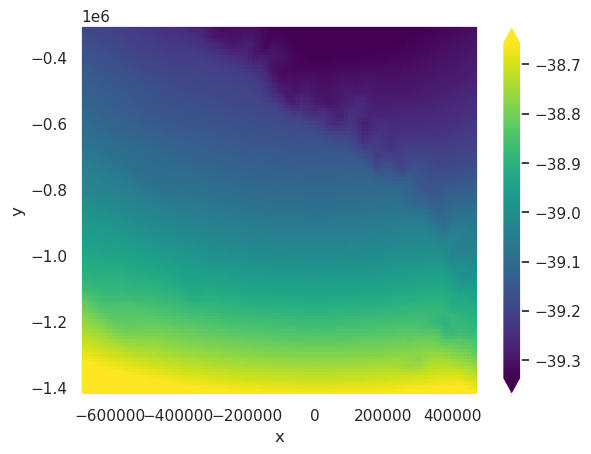

In [83]:
grav_grids = df.set_index(["y", "x"]).to_xarray()

offset = np.nanmean(grav_grids.terrain_effect - grav_grids.stripping_effect_as_masses)

stripping_centered = grav_grids.stripping_effect_as_masses + offset


dif = grav_grids.terrain_effect - stripping_centered

region = regions.ross_ice_shelf

dif = dif.sel(
    x=slice(region[0], region[1]),
    y=slice(region[2], region[3]),
)
dif.plot(robust=True)

In [84]:
data_grids = [
    # grav_grids.ice_surface_grav,
    # grav_grids.water_surface_grav,
    # grav_grids.bed_grav,
    grav_grids.disturbance,
    grav_grids.terrain_effect,
    stripping_centered,
    grav_grids.terrain_free_disturbance,
]
data_names = [
    # "Ice surface",
    # "Water surface",
    # "Bed surface",
    "Disturbance",
    "Terrain effect",
    "Stripping terrain effect",
    "Topo-free disturbance",
]
data_dict = profile.make_data_dict(
    names=data_names,
    grids=data_grids,
    colors=[
        # "cyan",
        # "blue",
        # "darkorange",
        "black",
        "red",
        "red",
        "blue",
    ],
    # axes = [0,0,0,1]
)

layer_names = [
    "ice",
    "water",
    "earth",
]
layer_colors = [
    "lightskyblue",
    "darkblue",
    "lightbrown",
]
layer_grids = [surface, icebase, bed]

layers_dict = profile.make_data_dict(
    names=layer_names,
    grids=layer_grids,
    colors=layer_colors,
)

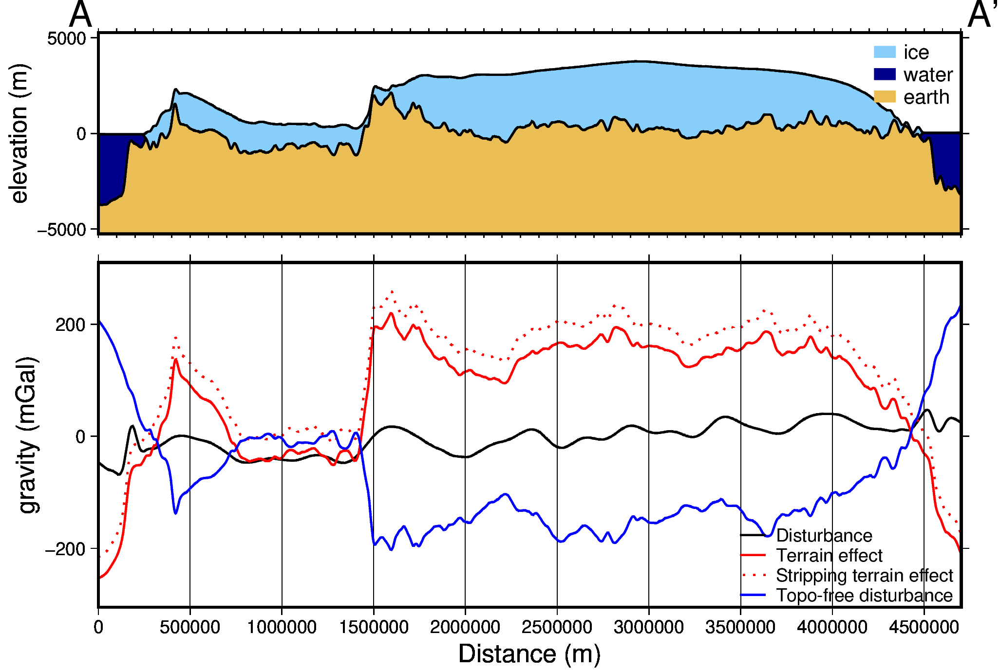

In [85]:
fig, df_layers, df_data = profile.plot_profile(
    "points",
    start=a,
    stop=b,
    num=10000,
    data_height=6,
    fig_height=10,
    fig_width=15,
    data_dict=data_dict,
    data_legend_loc="jBR+o0c/-.1c",  # "jBL+jTL+o0c/.4c",
    data_buffer=0.1,
    data_frame=["neSW", "ya+lgravity (mGal)", "xag+lDistance (m)"],
    data_pen_style=[None, None, ".", None],
    share_yaxis=True,
    layers_dict=layers_dict,
    layers_legend=True,
    layer_buffer=0.2,
    layers_legend_loc="jTR",
    # layers_legend_box="+gwhite",
    # layers_legend_scale=.5,
    # layers_pen_thickness=[1.5,1.5,1.5,.6, .6],
    layers_pen_color="black",
    # layers_pen_style=[None,None,None,"-."],
    # layer_transparency=[40,40,30,100,100],
    layers_frame=["nesW", "ya+lelevation (m)", "xf"],
    start_label="A",
    end_label="A' ",
)
fig.show()

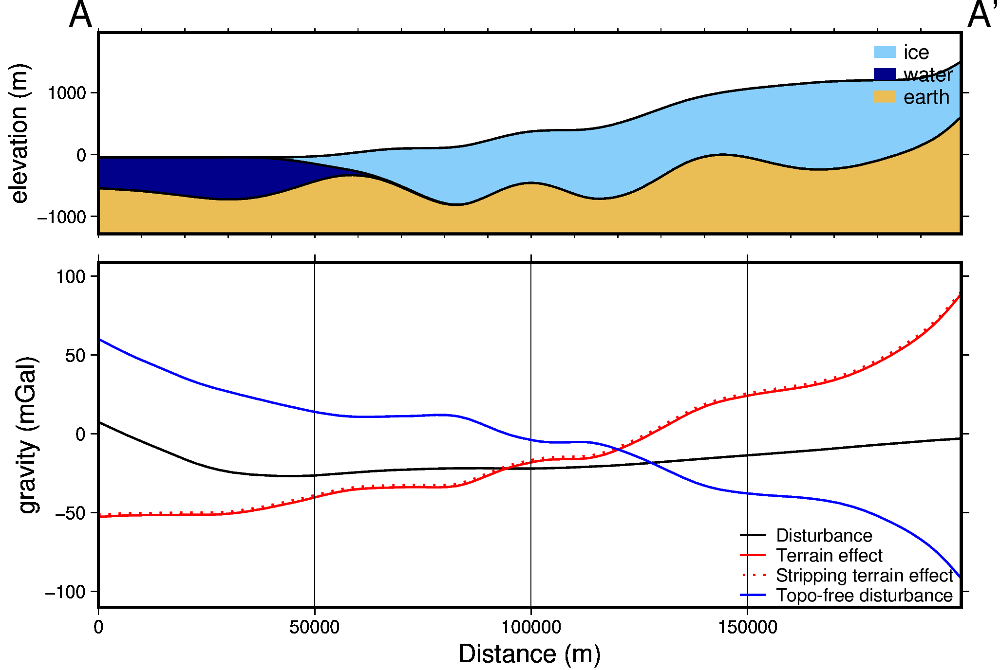

In [80]:
fig, df_layers, df_data = profile.plot_profile(
    "points",
    start=a,
    stop=b,
    num=10000,
    min_dist=200e3,
    max_dist=400e3,
    clip=True,
    data_height=6,
    fig_height=10,
    fig_width=15,
    data_dict=data_dict,
    data_legend_loc="jBR+o0c/-.1c",  # "jBL+jTL+o0c/.4c",
    data_buffer=0.1,
    data_frame=["neSW", "ya+lgravity (mGal)", "xag+lDistance (m)"],
    data_pen_style=[None, None, ".", None],
    share_yaxis=True,
    layers_dict=layers_dict,
    layers_legend=True,
    layer_buffer=0.2,
    layers_legend_loc="jTR",
    # layers_legend_box="+gwhite",
    # layers_legend_scale=.5,
    # layers_pen_thickness=[1.5,1.5,1.5,.6, .6],
    layers_pen_color="black",
    # layers_pen_style=[None,None,None,"-."],
    # layer_transparency=[40,40,30,100,100],
    layers_frame=["nesW", "ya+lelevation (m)", "xf"],
    start_label="A",
    end_label="A' ",
)
fig.show()

## Plot grids

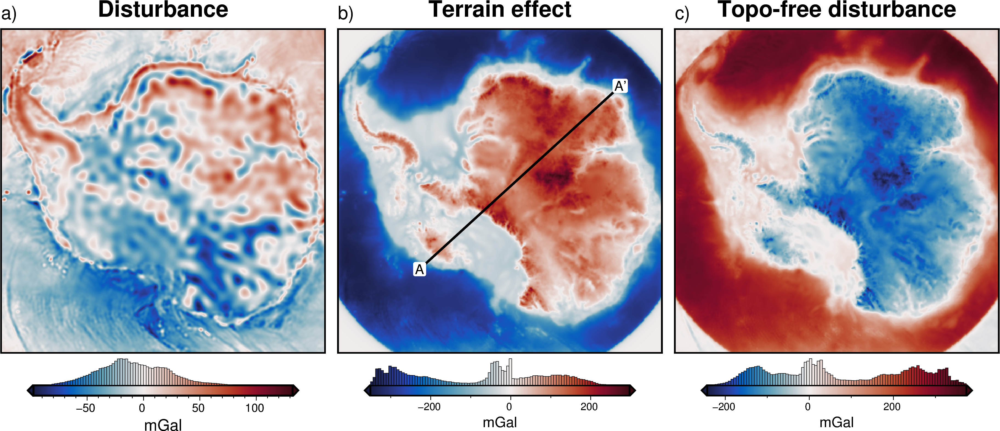

In [87]:
grav_grids = df.set_index(["y", "x"]).to_xarray()

grids = [
    grav_grids.disturbance,
    grav_grids.terrain_effect,
    grav_grids.terrain_free_disturbance,
]

titles = [
    "Disturbance",
    "Terrain effect",
    "Topo-free disturbance",
]

# lims = [utils.get_min_max(i, robust=True) for i in grids]
# lims = [min([i for i in lims[0]]), max([i for i in lims[1]])]
# lims = utils.get_min_max(grids[2])

for i, g in enumerate(grids):
    if i == 0:
        fig = None
        origin_shift = "initialize"
    else:
        fig = fig
        origin_shift = "xshift"

    fig = maps.plot_grd(
        grid=g,
        fig_height=10,
        cmap="balance+h0",
        # cpt_lims=lims,
        title=titles[i],
        cbar_label="mGal",
        hist=True,
        cbar_yoffset=1,
        fig=fig,
        origin_shift=origin_shift,
    )
    fig.text(
        position="TL",
        justify="BL",
        text=f"{string.ascii_lowercase[i]})",
        font="16p,Helvetica,black",
        offset="j0/.3",
        no_clip=True,
    )

    if i == 1:
        # plot profile location, and endpoints on map
        fig.plot(
            vd.line_coordinates(a, b, size=100),
            pen="2p,black",
        )
        fig.text(
            x=a[0],
            y=a[1],
            text="A",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
        )
        fig.text(
            x=b[0],
            y=b[1],
            text="A'",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
        )

fig.show()

# Compare stripping methods

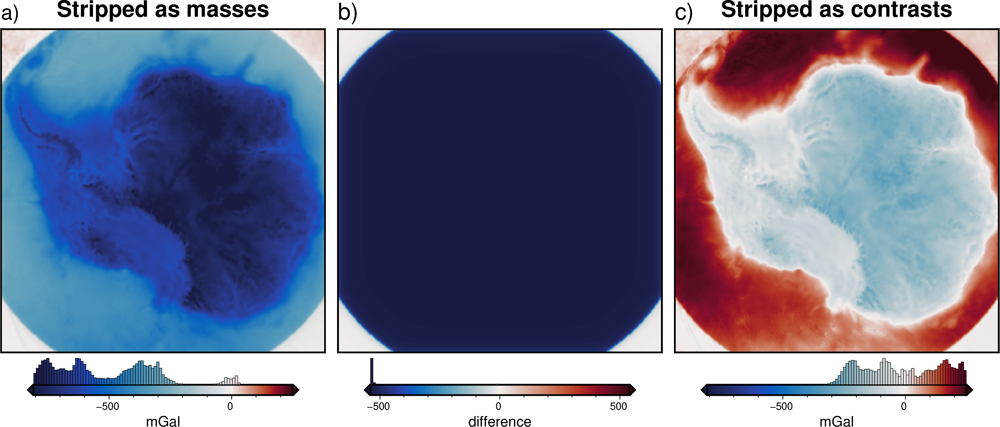

In [205]:
grav_grids = df.set_index(["y", "x"]).to_xarray()

# compare with Terrain-free gravity disturbance
anttgg_diff_grids = utils.grd_compare(
    grav_grids.stripped_disturbance_as_masses,
    grav_grids.stripped_disturbance_as_contrasts,
    fig_height=10,
    plot=True,
    grid1_name="Stripped as masses",
    grid2_name="Stripped as contrasts",
    cbar_label="mGal",
    title="",
    rmse_in_title=False,
    inset=False,
    coast=False,
    cmap="balance+h",
    diff_cmap="balance",
    hist=True,
    cbar_yoffset=1,
    subplot_labels=True,
    robust=True,
    # shading="+a45+nt0.2",
)

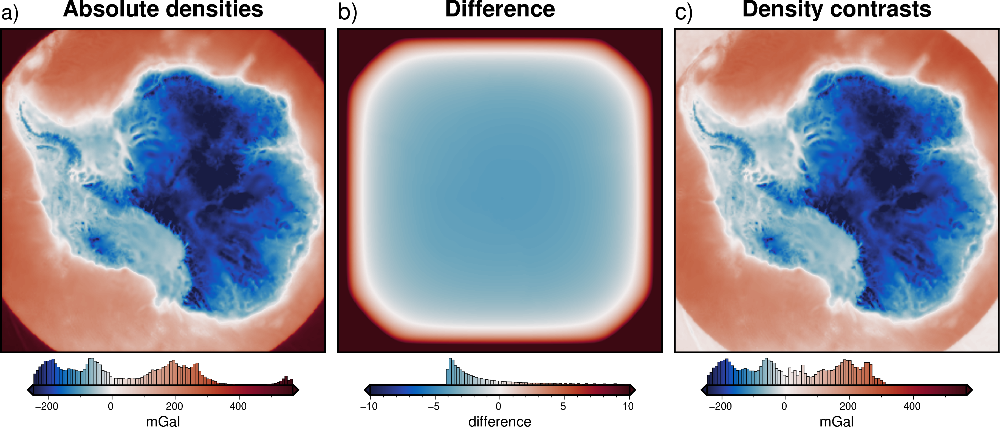

In [211]:
grav_grids = df.set_index(["y", "x"]).to_xarray()

absolute_densities = grav_grids.stripped_disturbance_as_masses - np.nanmedian(
    grav_grids.stripped_disturbance_as_masses
)
density_contrasts = grav_grids.stripped_disturbance_as_contrasts - np.nanmedian(
    grav_grids.stripped_disturbance_as_contrasts
)

dif = absolute_densities - density_contrasts
rmse = inv_utils.RMSE(dif)

# compare stripping ice and water as absolute densities vs density contrasts
anttgg_diff_grids = utils.grd_compare(
    absolute_densities,
    density_contrasts,
    fig_height=10,
    plot=True,
    grid1_name="Absolute densities",
    grid2_name="Density contrasts",
    cbar_label="mGal",
    title="Difference",
    rmse_in_title=False,
    inset=False,
    coast=False,
    cmap="balance+h",
    diff_cmap="balance",
    diff_lims=[-10, 10],
    hist=True,
    cbar_yoffset=1,
    subplot_labels=True,
    robust=True,
    # shading="+a45+nt0.2",
)

In [37]:
antgg_disturbance

<xarray.DataArray 'z' (y: 561, x: 561)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * x        (x) float64 -2.8e+06 -2.79e+06 -2.78e+06 ... 2.79e+06 2.8e+06
  * y        (y) float64 -2.8e+06 -2.79e+06 -2.78e+06 ... 2.79e+06 2.8e+06
Attributes:
    long_name:     z
    actual_range:  [-219.1499939   178.02998352]

# Profile of stripping results

## Plot grids

In [14]:
df

,y,x,eigen_gravity,geoid,lat,lon,obs_height_ellipsoid,obs_height_geoid,normal_gravity,disturbance,...,surface_forward,icebase_forward,bed_forward,ice_forward,water_forward,ice_and_water_effect_as_masses,stripped_disturbance_as_masses,ice_and_water_effect_as_contrasts,stripped_disturbance_as_contrasts,earth_forward
0,-2800000.0,-2800000.0,978411.30,-17.313961,-54.673529,-135.000000,10000.0,9982.686039,978401.798229,9.514271,...,-0.088998,-0.000730,-0.541091,0.019534,0.596146,1.612811,7.901459,-0.630819,10.145090,0.997132
1,-2800000.0,-2790000.0,978413.80,-17.490627,-54.732780,-135.102497,10000.0,9982.509373,978406.868187,6.944313,...,-0.090605,-0.000740,-0.550758,0.019643,0.606314,1.637309,5.307004,-0.642103,7.586416,1.011352
2,-2800000.0,-2780000.0,978416.94,-17.642357,-54.791943,-135.205360,10000.0,9982.357643,978411.926991,5.010509,...,-0.092252,-0.000751,-0.560642,0.019753,0.616716,1.662382,3.348128,-0.653644,5.664153,1.025913
3,-2800000.0,-2770000.0,978421.20,-17.720049,-54.851019,-135.308592,10000.0,9982.279951,978416.974575,4.212925,...,-0.093939,-0.000761,-0.570750,0.019863,0.627356,1.688048,2.524877,-0.665449,4.878374,1.040828
4,-2800000.0,-2760000.0,978426.70,-17.750841,-54.910005,-135.412193,10000.0,9982.249159,978422.010876,4.676624,...,-0.095667,-0.000772,-0.581089,0.019974,0.638244,1.714327,2.962297,-0.677528,5.354152,1.056109
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
314716,2800000.0,2760000.0,978459.06,44.854546,-54.910005,44.587807,10000.0,10044.854546,978422.010876,37.051624,...,-0.054519,0.001062,-0.547004,0.045451,0.634589,1.791438,35.260186,-0.600461,37.652086,1.111399
314717,2800000.0,2770000.0,978456.44,45.059135,-54.851019,44.691408,10000.0,10045.059135,978416.974575,39.462925,...,-0.053195,0.001049,-0.534041,0.045142,0.621838,1.767354,37.695571,-0.586187,40.049112,1.100374
314718,2800000.0,2780000.0,978453.25,45.191975,-54.791943,44.794640,10000.0,10045.191975,978411.926991,41.323009,...,-0.051907,0.001035,-0.521440,0.044836,0.609419,1.743759,39.579251,-0.572311,41.895320,1.089503
314719,2800000.0,2790000.0,978449.50,45.316578,-54.732780,44.897503,10000.0,10045.316578,978406.868187,42.631813,...,-0.050654,0.001022,-0.509188,0.044532,0.597322,1.720636,40.911177,-0.558819,43.190632,1.078783


In [76]:
# lines = profile.draw_lines()

In [20]:
# # get clicked points
# points = utils.shapes_to_df(lines)
# # extract first and last
# a = (points.x.iloc[0], points.y.iloc[0])
# b = (points.x.iloc[-1], points.y.iloc[-1])

# MBL to EANT
a, b = (
    (-1389631.4489983942, -1352746.2662278207),
    (2083349.1138809533, 1817557.53318993),
)

# Ross Sea to EANT
# a, b = ((-312920.35753459873, -1284991.7782136113),
#  (923833.1080392714, 2032725.5128640563))
a, b

((-1389631.4489983942, -1352746.2662278207),
 (2083349.1138809533, 1817557.53318993))

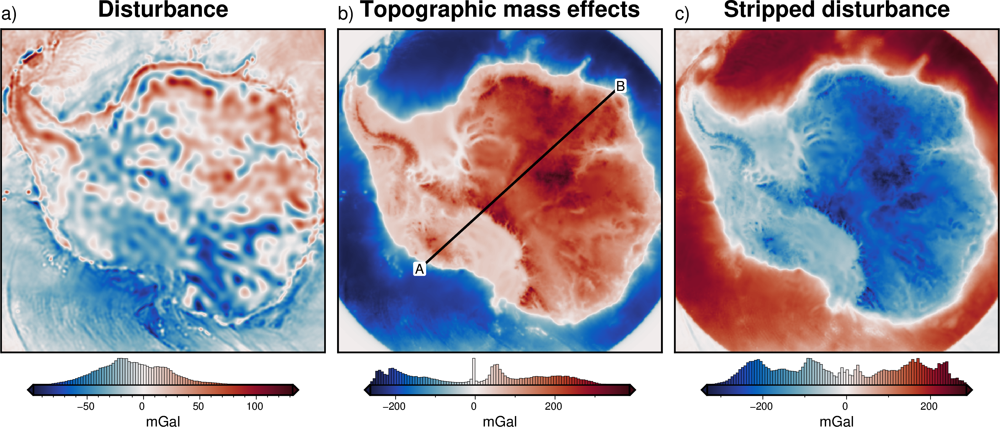

In [62]:
grav_grids = df.set_index(["y", "x"]).to_xarray()

grids = [
    grav_grids.disturbance,
    grav_grids.stripping_effect_as_contrasts,
    grav_grids.stripped_disturbance_as_contrasts,
]

titles = [
    "Disturbance",
    "Topographic mass effects",
    "Stripped disturbance",
]

# lims = [utils.get_min_max(i, robust=True) for i in grids]
# lims = [min([i for i in lims[0]]), max([i for i in lims[1]])]
# lims = utils.get_min_max(grids[2])

for i, g in enumerate(grids):
    if i == 0:
        fig = None
        origin_shift = "initialize"
    else:
        fig = fig
        origin_shift = "xshift"

    fig = maps.plot_grd(
        grid=g,
        fig_height=10,
        cmap="balance+h0",
        # cpt_lims=lims,
        title=titles[i],
        cbar_label="mGal",
        hist=True,
        cbar_yoffset=1,
        fig=fig,
        origin_shift=origin_shift,
    )
    fig.text(
        position="TL",
        justify="BL",
        text=f"{string.ascii_lowercase[i]})",
        font="16p,Helvetica,black",
        offset="j0/.3",
        no_clip=True,
    )

    if i == 1:
        # plot profile location, and endpoints on map
        fig.plot(
            vd.line_coordinates(a, b, size=100),
            pen="2p,black",
        )
        fig.text(
            x=a[0],
            y=a[1],
            text="A",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
        )
        fig.text(
            x=b[0],
            y=b[1],
            text="B",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
        )

fig.show()

## Profile

In [63]:
data_grids = [
    grav_grids.surface_forward,
    grav_grids.icebase_forward,
    grav_grids.bed_forward,
    grav_grids.stripping_effect_as_contrasts,
    grav_grids.disturbance,
    grav_grids.stripped_disturbance_as_masses
    - np.nanmedian(grav_grids.stripped_disturbance_as_masses),
]
data_names = [
    "Ice surface",
    "Water surface",
    "Bed surface",
    "Total terrain effect",
    "Disturbance",
    "Stripped disturbance",
]
data_dict = profile.make_data_dict(
    names=data_names,
    grids=data_grids,
    colors=[
        "cyan",
        "blue",
        "lightbrown",
        "black",
        "purple",
        "red",
    ],
    # axes = [0,0,0]
)

layer_names = [
    "surface",
    "icebase",
    "bed",
]
layer_colors = [
    "lightskyblue",
    "darkblue",
    "lightbrown",
]
layer_grids = [surface, icebase, bed]

layers_dict = profile.make_data_dict(
    names=layer_names,
    grids=layer_grids,
    colors=layer_colors,
)

legend [WARNING]: File <stdin> is empty!


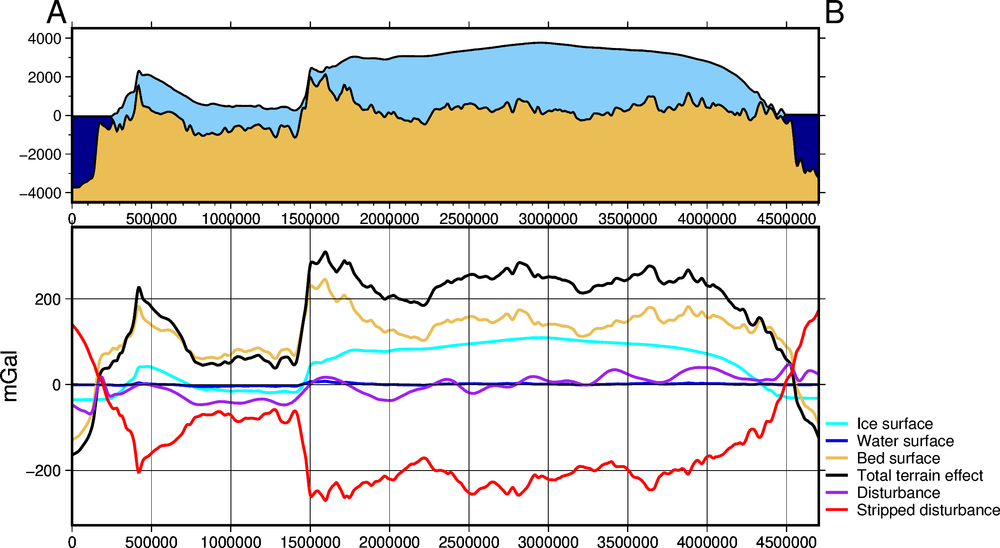

In [64]:
fig_height = 10
fig_width = 15
fig = profile.plot_profile(
    "points",
    start=a,
    stop=b,
    num=1000,
    fig_height=fig_height,
    fig_width=fig_width,
    # add_map=True,
    # map_buffer=0.2,
    # subplot_orientation='horizontal',
    # subplot_orientation='vertical',
    data_dict=data_dict,
    share_yaxis=False,
    data_height=6,
    data_y0_label="mGal",
    data_y1_label="mGal",
    # data_legend_loc = "jBR+o0c",
    # data_pen=[3,1.5,1.5,2,1.5,1.5],
    data_pen=[1.5 for x in data_dict.items()],
    # default_layers_reference="ellipsoid",
    layers_dict=layers_dict,
    # clip=True,
    # max_dist=300e3,
    # min_dist=200e3,
)
fig.show()

In [26]:
data_grids = [
    grav_grids.disturbance,
    grav_grids.stripping_effect_as_contrasts,
    grav_grids.stripped_disturbance_as_masses,
]
data_names = [
    "Disturbance",
    "Terrain effect",
    "Terrain-free disturbance",
]

data_dict = profile.make_data_dict(
    names=data_names,
    grids=data_grids,
    colors=[
        "black",
        "red",
        "blue",
        "darkorange",
    ],
    axes=[0, 0, 0],
)

legend [WARNING]: File <stdin> is empty!


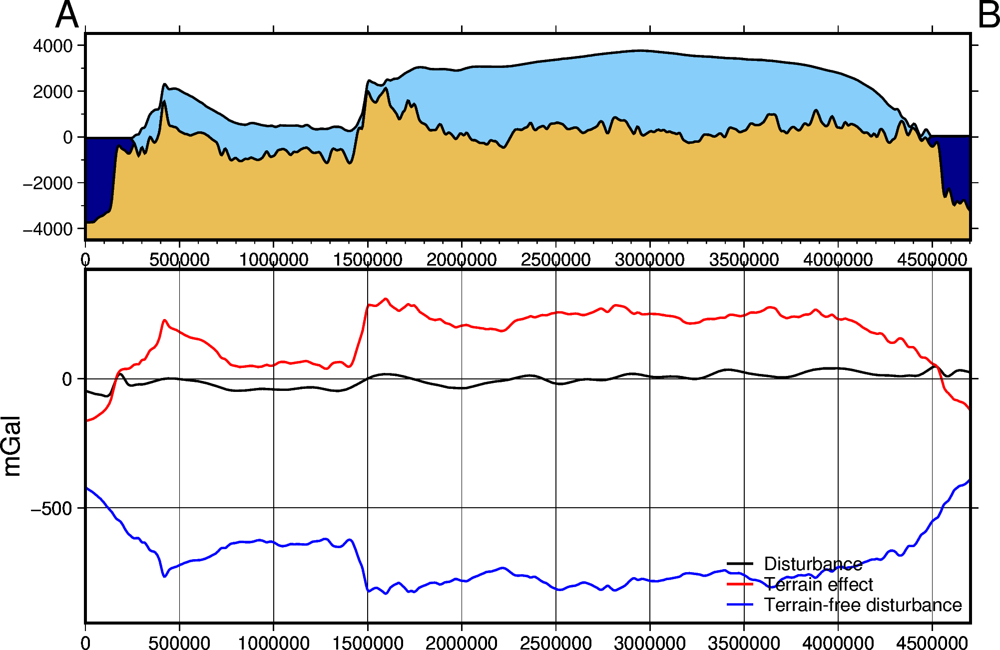

In [27]:
fig_height = 10
fig_width = 15
fig = profile.plot_profile(
    "points",
    start=a,
    stop=b,
    num=1000,
    fig_height=fig_height,
    fig_width=fig_width,
    # add_map=True,
    # map_buffer=0.2,
    # subplot_orientation='horizontal',
    # subplot_orientation='vertical',
    data_dict=data_dict,
    layers_dict=layers_dict,
    share_yaxis=False,
    data_height=6,
    data_y0_label="mGal",
    data_y1_label="mGal",
    data_legend_loc="jBR+o0c",
)
fig.show()

# Stripping contrasts (zref=mean)

## Surface prisms

In [155]:
# create prisms around surface
# positive densities above reference, negative below
density = ice_density - air_density
print(f"Surface density contrast: {density}kgm-3")

zref = np.nanmean(surface)

surface_prisms = inv_utils.grids_to_prisms(
    surface=surface,
    reference=zref,
    density=xr.where(surface >= zref, density, -density),
    input_coord_names=["x", "y"],
)

Surface density contrast: 916kgm-3


## Icebase prisms

In [156]:
# create prisms around icebase
# positive densities above reference, negative below
density = water_density - ice_density
print(f"Icebase density contrast: {density}kgm-3")

zref = np.nanmean(icebase)

icebase_prisms = inv_utils.grids_to_prisms(
    surface=icebase,
    reference=zref,
    density=xr.where(icebase >= zref, density, -density),
    input_coord_names=["x", "y"],
)

Icebase density contrast: 107kgm-3


## Bed prisms

In [157]:
# create prisms around bed
# positive densities above reference, negative below
density = earth_density - water_density
print(f"Bed density contrast: {density}kgm-3")

zref = np.nanmean(bed)

bed_prisms = inv_utils.grids_to_prisms(
    surface=bed,
    reference=zref,
    density=xr.where(bed >= zref, density, -density),
    input_coord_names=["x", "y"],
)

Bed density contrast: 1646kgm-3


## Calculate gravity

In [158]:
df.head()

,y,x,eigen_gravity,geoid,lat,lon,obs_height_ellipsoid,obs_height_geoid,normal_gravity,disturbance,...,terrain_free_disturbance,surface_forward,icebase_forward,bed_forward,ice_forward,water_forward,ice_and_water_effect_as_masses,stripped_disturbance_as_masses,ice_and_water_effect_as_contrasts,stripped_disturbance_as_contrasts
0,-2800000.0,-2800000.0,978411.30,-17.313961,-54.673529,-135.000000,10000.0,9982.686039,978401.798229,9.514271,...,10.470379,-0.088998,-0.000730,-0.541091,0.019534,0.596146,0.615680,8.898591,-0.630819,10.145090
1,-2800000.0,-2790000.0,978413.80,-17.490627,-54.732780,-135.102497,10000.0,9982.509373,978406.868187,6.944313,...,7.916893,-0.090605,-0.000740,-0.550758,0.019643,0.606314,0.625957,6.318355,-0.642103,7.586416
2,-2800000.0,-2780000.0,978416.94,-17.642357,-54.791943,-135.205360,10000.0,9982.357643,978411.926991,5.010509,...,5.999939,-0.092252,-0.000751,-0.560642,0.019753,0.616716,0.636468,4.374041,-0.653644,5.664153
3,-2800000.0,-2770000.0,978421.20,-17.720049,-54.851019,-135.308592,10000.0,9982.279951,978416.974575,4.212925,...,5.219593,-0.093939,-0.000761,-0.570750,0.019863,0.627356,0.647220,3.565705,-0.665449,4.878374
4,-2800000.0,-2760000.0,978426.70,-17.750841,-54.910005,-135.412193,10000.0,9982.249159,978422.010876,4.676624,...,5.700933,-0.095667,-0.000772,-0.581089,0.019974,0.638244,0.658218,4.018406,-0.677528,5.354152


In [159]:
# calculate forward gravity
forward_grav_grid, forward_grav_df = inv_utils.forward_grav_of_prismlayer(
    [surface_prisms, icebase_prisms, bed_prisms],
    df,
    names=[
        "surface_prisms",
        "icebase_prisms",
        "bed_prisms",
    ],
    coord_names=["x", "y", "obs_height_ellipsoid"],
    progressbar=True,
    plot=False,
)

df["surface_forward"] = forward_grav_df.surface_prisms
df["icebase_forward"] = forward_grav_df.icebase_prisms
df["bed_forward"] = forward_grav_df.bed_prisms

df.describe()

  0%|                                                | 0/314721 [00:00<?, ?it/s]

  0%|                                                | 0/314721 [00:00<?, ?it/s]

  0%|                                                | 0/314721 [00:00<?, ?it/s]

,y,x,eigen_gravity,geoid,lat,lon,obs_height_ellipsoid,obs_height_geoid,normal_gravity,disturbance,...,terrain_free_disturbance,surface_forward,icebase_forward,bed_forward,ice_forward,water_forward,ice_and_water_effect_as_masses,stripped_disturbance_as_masses,ice_and_water_effect_as_contrasts,stripped_disturbance_as_contrasts
count,3.147210e+05,3.147210e+05,314721.000000,314721.000000,314721.000000,314721.000000,314721.0,314721.000000,314721.000000,314721.000000,...,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000
mean,0.000000e+00,0.000000e+00,979488.797474,-14.109855,-70.501232,0.160142,10000.0,9985.890145,979498.184552,-9.387069,...,72.987374,0.305065,0.000623,1.502271,31.960815,71.274865,103.235680,-112.622749,1.807959,-11.195028
std,1.619468e+06,1.619468e+06,380.408055,28.106898,7.152484,103.404070,0.0,28.106898,384.692027,29.876707,...,162.467043,46.117344,1.709395,131.508809,44.171219,80.228736,62.679929,74.533491,167.741226,162.836704
min,-2.800000e+06,-2.800000e+06,978391.440000,-66.122870,-90.000000,-179.795373,10000.0,9933.877129,978401.798229,-97.639721,...,-242.804246,-35.977759,-8.606594,-231.342387,0.019534,0.228260,0.427512,-265.384511,-263.019496,-332.481282
25%,-1.400000e+06,-1.400000e+06,979216.940000,-37.590160,-75.509262,-89.795373,10000.0,9962.409840,979222.512686,-29.984284,...,-67.215105,-33.478918,-0.272660,-134.721106,0.141497,0.824345,42.842138,-181.086898,-168.562639,-156.751262
50%,0.000000e+00,0.000000e+00,979497.400000,-16.644913,-69.610713,0.000000,10000.0,9983.355087,979509.874405,-11.344771,...,32.748675,-30.845631,-0.060676,55.558149,0.803147,19.833254,105.544490,-111.649227,32.892453,-26.191489
75%,1.400000e+06,1.400000e+06,979808.500000,11.482105,-65.152388,90.000000,10000.0,10011.482105,979816.006810,11.593298,...,233.091106,34.033621,0.110296,110.241663,66.017209,157.772842,158.076579,-55.027722,147.018395,145.659694
max,2.800000e+06,2.800000e+06,980167.600000,45.484573,-54.673529,180.000000,10000.0,10045.484573,980142.335092,132.368033,...,373.727963,121.084959,9.527744,268.020159,155.035543,220.533103,220.651454,111.302859,386.515166,285.621276


## Correct the observed gravity

In [16]:
df["stripping_effect_as_contrasts"] = (
    df.surface_forward + df.icebase_forward + df.bed_forward
)

df["stripped_disturbance_as_contrasts"] = (
    df.disturbance - df.stripping_effect_as_contrasts
)

df.describe()

,y,x,eigen_gravity,geoid,lat,lon,obs_height_ellipsoid,obs_height_geoid,normal_gravity,disturbance,...,bed_forward,ice_forward,water_forward,ice_and_water_effect_as_masses,stripped_disturbance_as_masses,ice_and_water_effect_as_contrasts,stripped_disturbance_as_contrasts,earth_forward,stripping_effect_as_masses,stripping_effect_as_contrasts
count,3.147210e+05,3.147210e+05,314721.000000,314721.000000,314721.000000,314721.000000,314721.0,314721.000000,314721.000000,314721.000000,...,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000,314721.000000
mean,0.000000e+00,0.000000e+00,979488.797474,-14.109855,-70.501232,0.160142,10000.0,9985.890145,979498.184552,-9.387069,...,1.502271,31.960815,71.274865,507.891525,-517.278594,1.807959,-11.195028,404.655845,507.891525,1.807959
std,1.619468e+06,1.619468e+06,380.408055,28.106898,7.152484,103.404070,0.0,28.106898,384.692027,29.876707,...,131.508809,44.171219,80.228736,209.113891,207.313606,167.741226,162.836704,237.353910,209.113891,167.741226
min,-2.800000e+06,-2.800000e+06,978391.440000,-66.122870,-90.000000,-179.795373,10000.0,9933.877129,978401.798229,-97.639721,...,-231.342387,0.019534,0.228260,1.612811,-872.324470,-263.019496,-332.481282,0.997132,1.612811,-263.019496
25%,-1.400000e+06,-1.400000e+06,979216.940000,-37.590160,-75.509262,-89.795373,10000.0,9962.409840,979222.512686,-29.984284,...,-134.721106,0.141497,0.824345,339.130068,-695.417992,-168.562639,-156.751262,166.613351,339.130068,-168.562639
50%,0.000000e+00,0.000000e+00,979497.400000,-16.644913,-69.610713,0.000000,10000.0,9983.355087,979509.874405,-11.344771,...,55.558149,0.803147,19.833254,569.647238,-562.078776,32.892453,-26.191489,517.616640,569.647238,32.892453
75%,1.400000e+06,1.400000e+06,979808.500000,11.482105,-65.152388,90.000000,10000.0,10011.482105,979816.006810,11.593298,...,110.241663,66.017209,157.772842,685.814341,-362.889925,147.018395,145.659694,606.934475,685.814341,147.018395
max,2.800000e+06,2.800000e+06,980167.600000,45.484573,-54.673529,180.000000,10000.0,10045.484573,980142.335092,132.368033,...,268.020159,155.035543,220.533103,926.257556,43.514573,386.515166,285.621276,863.177150,926.257556,386.515166


## Save to CSV

In [17]:
df.to_csv(
    "../data/Antarctic_gravity_reduction.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)

In [18]:
df = pd.read_csv(
    "../data/Antarctic_gravity_reduction.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
df

,y,x,eigen_gravity,geoid,lat,lon,obs_height_ellipsoid,obs_height_geoid,normal_gravity,disturbance,...,bed_forward,ice_forward,water_forward,ice_and_water_effect_as_masses,stripped_disturbance_as_masses,ice_and_water_effect_as_contrasts,stripped_disturbance_as_contrasts,earth_forward,stripping_effect_as_masses,stripping_effect_as_contrasts
0,-2800000.0,-2800000.0,978411.30,-17.313961,-54.673529,-135.000000,10000.0,9982.686039,978401.798229,9.514271,...,-0.541091,0.019534,0.596146,1.612811,7.901459,-0.630819,10.145090,0.997132,1.612811,-0.630819
1,-2800000.0,-2790000.0,978413.80,-17.490627,-54.732780,-135.102497,10000.0,9982.509373,978406.868187,6.944313,...,-0.550758,0.019643,0.606314,1.637309,5.307004,-0.642103,7.586416,1.011352,1.637309,-0.642103
2,-2800000.0,-2780000.0,978416.94,-17.642357,-54.791943,-135.205360,10000.0,9982.357643,978411.926991,5.010509,...,-0.560642,0.019753,0.616716,1.662382,3.348128,-0.653644,5.664153,1.025913,1.662382,-0.653644
3,-2800000.0,-2770000.0,978421.20,-17.720049,-54.851019,-135.308592,10000.0,9982.279951,978416.974575,4.212925,...,-0.570750,0.019863,0.627356,1.688048,2.524877,-0.665449,4.878374,1.040828,1.688048,-0.665449
4,-2800000.0,-2760000.0,978426.70,-17.750841,-54.910005,-135.412193,10000.0,9982.249159,978422.010876,4.676624,...,-0.581089,0.019974,0.638244,1.714327,2.962297,-0.677528,5.354152,1.056109,1.714327,-0.677528
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
314716,2800000.0,2760000.0,978459.06,44.854546,-54.910005,44.587807,10000.0,10044.854546,978422.010876,37.051624,...,-0.547004,0.045451,0.634589,1.791438,35.260186,-0.600461,37.652086,1.111399,1.791438,-0.600461
314717,2800000.0,2770000.0,978456.44,45.059135,-54.851019,44.691408,10000.0,10045.059135,978416.974575,39.462925,...,-0.534041,0.045142,0.621838,1.767354,37.695571,-0.586187,40.049112,1.100374,1.767354,-0.586187
314718,2800000.0,2780000.0,978453.25,45.191975,-54.791943,44.794640,10000.0,10045.191975,978411.926991,41.323009,...,-0.521440,0.044836,0.609419,1.743759,39.579251,-0.572311,41.895320,1.089503,1.743759,-0.572311
314719,2800000.0,2790000.0,978449.50,45.316578,-54.732780,44.897503,10000.0,10045.316578,978406.868187,42.631813,...,-0.509188,0.044532,0.597322,1.720636,40.911177,-0.558819,43.190632,1.078783,1.720636,-0.558819


In [177]:
grav_grids = df.set_index(["y", "x"]).to_xarray()

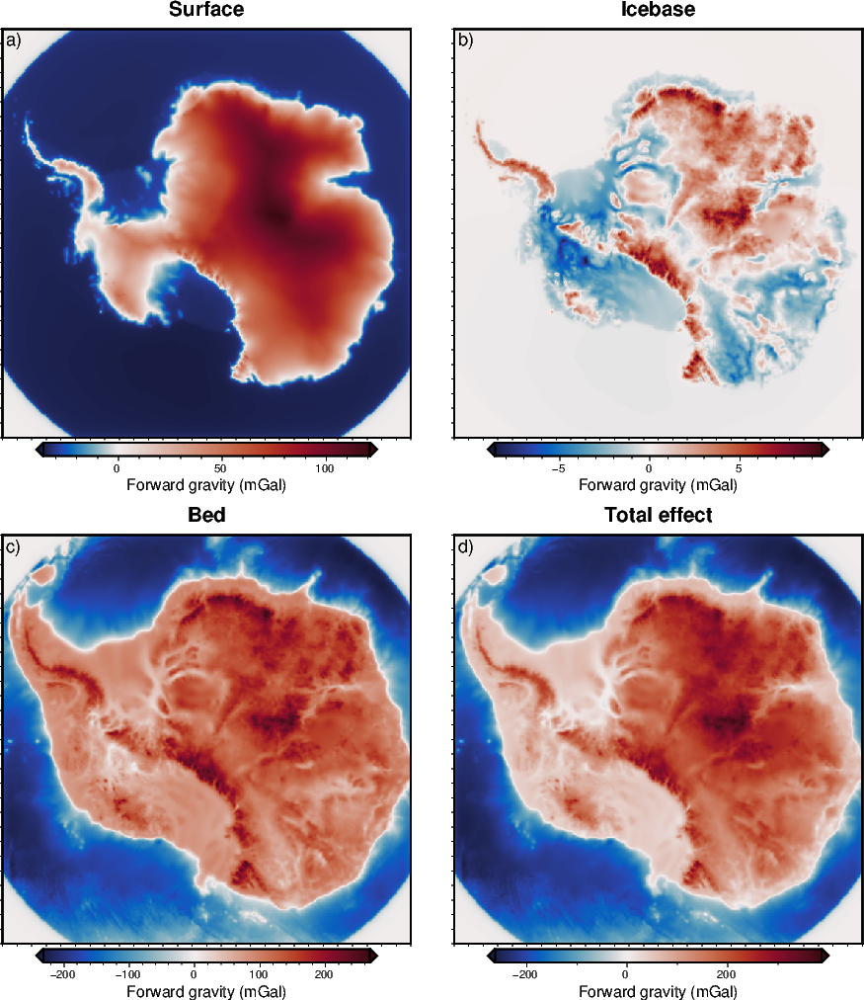

In [164]:
grids = [
    grav_grids.surface_forward,
    grav_grids.icebase_forward,
    grav_grids.bed_forward,
    grav_grids.stripping_effect_as_contrasts,
]

titles = [
    "Surface",
    "Icebase",
    "Bed",
    "Total effect",
]

# lims = [utils.get_min_max(i, robust=True) for i in grids]
# lims = [min([i for i in lims[0]]), max([i for i in lims[1]])]

maps.subplots(
    grids=grids,
    subplot_titles=titles,
    cbar_labels=["Forward gravity (mGal)" for x in grids],
    # cpt_limits = [lims for x in grids],
    cmaps=["balance+h0" for x in grids],
    dims=[2, 2],
    margins=[".5c", "1.5c"],
    autolabel=True,
)